<a href="https://colab.research.google.com/github/JorgeEduardoPL/Preparacion-y-modelacion-de-la-base-de-Datos/blob/main/Equipo_3_301_Parte1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Importamos librerías requeridas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Instalamos librería para análisis de variables categóricas
%pip install funpymodeling

In [3]:
from funpymodeling.exploratory import freq_tbl

In [ ]:
#Cargar archivo csv desde equipo
from google.colab import files
files.upload()

In [5]:
#Ajustar maximo de filas
pd.options.display.max_rows= None
pd.options.display.max_columns= None

In [6]:
#Carga desde un archivo .csv sin indice y con decodificación. Ejemplos: 'ascii', 'UTF-8'
df = pd.read_csv("Recolección de datos Negocios - IN 1002B  (Miércoles 22 de Noviembre 2023).csv")
df.head(30)

,Marca temporal,Nombre del estudiante entrevistador,Matrícula del estudiante entrevistador,Grupo al cual pertenece,Equipo del entrevistador,Nombre del negocio a entrevistar,Dirección del negocio a entrevistar,Colonia/zona del negocio a entrevistar,Tipo de negocio,Rol de la persona entrevistada,Antiguedad del negocio,"¿Cuántos clientes, en promedio, recibe en un día entre semana?","¿Cuántos clientes, en promedio, recibe en un día del fin de semana?",¿Cuántos productos aproximadamente maneja en su tienda?,En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana),¿Qué forma de pago permite a sus clientes?,"¿Ha participado en algún plan de colaboración con otras tiendas o empresas? \n(por ejemplo, esfuerzos conjuntos de marketing, compras al por mayor, servicios de entrega compartidos)",En caso de una respuesta afirmativa a la pregunta anterior ¿Qué le motivó a explorar oportunidades de colaboración en su negocio de tiendas? \n(Seleccione todas las que procedan),¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan),En los últimos seis meses ¿ha implementado alguna tecnología digital en su negocio?,"En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados",¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan),¿A través de cuáles de los siguientes medios se comunicas con los proveedores?,¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?,¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan),¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?,¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido",¿Considera necesario el apoyo gubernamental para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido.1","Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan)",En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?,"En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?","Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan).1","En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?"
0,2/11/2023 19:14:21,Eduardo Yael Tomas Chapital,A01736657,G303 (LMiJ con Diana y Andrés),4,Prueba1,Prueba 2,Prueba colonia,Prueba,Dueño del negocio,Entre 0 y 6 meses,2,2,2,2 veces al mes,Efectivo,Sí,Obtener más clientes,Dificultad para encontrar socios adecuados,No,NaN,Aumentar las ventas,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Muy satisfecho,No,NaN,No,NaN,Reducido el consumo de agua,NaN,7,Se ha comprometido con causas del sector en el...,8
1,3/11/2023 13:04:08,Josue Nicolás Perez Villegas,A01737346,G301 (LMiJ con Gabriela y Alfredo),3,Helados siente la alegría,Calle 5 de mayo y calle reforma,Centro histórico de puebla,Heladería,Empleado permanente,Entre 6 meses y un año,120,80,"3 sabores de helado fresa, vainilla y helado",1 vez a la semana,Efectivo,No,NaN,Problemas de confianza y fiabilidad,No,NaN,Ninguna,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Algo satisfecho,No,NaN,Sí,Ninguno,Cambiado la forma de un producto para que sea ...,NaN,7,Se ha comprometido con causas del sector en el...,9
2,3/11/2023 13:09:02,Alan De La Fuente Pérez,A01737659,G301 (LMiJ con Gabriela y Alfredo),3,Librería Leon,Entre 3 y 5 sur,Centro histórico,Librería,Empleado temporal,En

In [7]:
#Analizar categorias de una columna
riesgo_categorias = df.groupby(['Equipo del entrevistador'])['Equipo del entrevistador'].count()
riesgo_categorias

Equipo del entrevistador
1            200
2            266
3            163
4            190
5            161
EQUIPO 3       1
Equipo 1      28
Equipo 1       1
Equipo 2      17
Equipo 2       2
Equipo 3      50
Equipo 3       2
Equipo 4      28
Equipo 5      31
Equipo 5       3
Equipo 7       1
Equipo3        1
G              1
N              2
Prueba 1       1
equipo 2       2
equipo 2       9
equipo 4       6
Name: Equipo del entrevistador, dtype: int64

In [8]:
#Eliminar un signo de una columna
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace('EQUIPO', '')
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace('Equipo', '')
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace('Prueba', '')
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace('G', '0')
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace('N', '0')
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace('equipo', '')
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace(' ', '')
df['Equipo del entrevistador']=df['Equipo del entrevistador'].str.replace('7', '0')

In [9]:
#Analizar categorias de una columna
riesgo_categorias = df.groupby(['Equipo del entrevistador'])['Equipo del entrevistador'].count()
riesgo_categorias

Equipo del entrevistador
0      4
1    230
2    296
3    217
4    224
5    195
Name: Equipo del entrevistador, dtype: int64

In [10]:
#Conversión de tipo de dato de columna de tipo Object a int
df['Equipo del entrevistador']= df['Equipo del entrevistador'].astype(int)

In [11]:
#Analizar categorias de una columna
riesgo_categorias = df.groupby(['¿Cuántos productos aproximadamente maneja en su tienda?'])['¿Cuántos productos aproximadamente maneja en su tienda?'].count()
riesgo_categorias

¿Cuántos productos aproximadamente maneja en su tienda?
+1000                                                                         1
+2000                                                                         1
+30                                                                           1
+300                                                                          1
0                                                                             2
1                                                                            52
10                                                                           75
10 pretendas diarias                                                          1
100                                                                          69
1000                                                                         16
10000                                                                         2
100000                                                          

In [12]:
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('+', '')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('pretendas diarias', '')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('sabores de helado fresa, vainilla y helado', '')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace(' y variedades', '')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('-100', '')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('-4', '')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('Mas de 20 productos', '20')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('Mas de 500', '500')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('Muchos', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('Muchos no tiene el dato exacto', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('No maneja produvtos', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('Prueba 1', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('el menu', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('Diversos productos como golosinas, materia prima o artículos para fiestas', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('Dulces, artículos de fiesta, materia prima.', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('ni ifea', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('s', '0')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace(' ', '')
df['¿Cuántos productos aproximadamente maneja en su tienda?']=df['¿Cuántos productos aproximadamente maneja en su tienda?'].str.replace('notieneeldatoexacto', '')

In [13]:
#Analizar categorias de una columna
riesgo_categorias = df.groupby(['¿Cuántos productos aproximadamente maneja en su tienda?'])['¿Cuántos productos aproximadamente maneja en su tienda?'].count()
riesgo_categorias

¿Cuántos productos aproximadamente maneja en su tienda?
0         11
1         52
10        76
100       69
1000      17
10000      2
100000     1
11         2
110        1
12        16
120       15
1200       3
12000      1
124        1
125        1
130        2
135        1
139        1
14         2
140        1
1400       1
15        58
150       26
1500       5
16         1
160        1
1600       1
17         3
175        1
18         4
180        2
19         2
2         35
20        64
200       48
2000       5
201        1
212        1
219        1
22         1
23         6
230        1
24         3
25        25
250       10
2500       1
26         3
270        1
28         2
3         44
30        62
300       24
3000       6
32         3
324        1
35        14
350        5
38         1
3987       1
4         32
40        37
400        5
42         1
45        11
450        1
4572       1
46         2
48         1
5         46
50        65
500       36
5000       3
54      

In [14]:
#Conversión de tipo de dato de columna de tipo Object a int
df['¿Cuántos productos aproximadamente maneja en su tienda?']= df['¿Cuántos productos aproximadamente maneja en su tienda?'].astype(int)

In [15]:
#Verificmaos informacion del Dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1166 entries, 0 to 1165
Data columns (total 35 columns):
 #   Column                                                                                                                                                                                Non-Null Count  Dtype  
---  ------                                                                                                                                                                                --------------  -----  
 0   Marca temporal                                                                                                                                                                        1166 non-null   object 
 1   Nombre del estudiante entrevistador                                                                                                                                                   1166 non-null   object 
 2   Matrícula del estudiante entrevistador      

In [16]:
#Identificar valores nulos por columna
valores_nulos=df.isnull().sum()
valores_nulos

Marca temporal                                                                                                                                                                             0
Nombre del estudiante entrevistador                                                                                                                                                        0
Matrícula del estudiante entrevistador                                                                                                                                                     0
Grupo al cual pertenece                                                                                                                                                                    0
Equipo del entrevistador                                                                                                                                                                   0
Nombre del negocio a entrevistar                       

In [17]:
#Cuarto método de sustitución de valores nulos
#Sustituir valores nulos por un string en  concreto
df["Nombre del negocio a entrevistar"] =df["Nombre del negocio a entrevistar"].fillna("Negocio")

In [18]:
#Quinto método de sustitución de valores nulos
#Sustituir valores nulos por valores no nulos hacia adelante  "forward fill" ("ffill")
#Filtro por columnas
df["En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana)"] =df["En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana)"].fillna(method="ffill")

<ipython-input-18-1ad0f8f0a3bb>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana)"] =df["En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana)"].fillna(method="ffill")


In [19]:
#Sexto método de sustitución de valores nulos
#Sustituir valores nulos por valores no nulos hacia atrás backward fill" ("bfill")
#Filtro por columnas
df["¿Qué forma de pago permite a sus clientes?"] =df["¿Qué forma de pago permite a sus clientes?"].fillna(method="bfill")

<ipython-input-19-bcfcd89623ce>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿Qué forma de pago permite a sus clientes?"] =df["¿Qué forma de pago permite a sus clientes?"].fillna(method="bfill")


In [20]:
#Cuarto método de sustitución de valores nulos
#Sustituir valores nulos por un string en  concreto
df["En caso de una respuesta afirmativa a la pregunta anterior ¿Qué le motivó a explorar oportunidades de colaboración en su negocio de tiendas? \n(Seleccione todas las que procedan)"] =df["En caso de una respuesta afirmativa a la pregunta anterior ¿Qué le motivó a explorar oportunidades de colaboración en su negocio de tiendas? \n(Seleccione todas las que procedan)"].fillna("No aplica")


In [21]:
#Sexto método de sustitución de valores nulos
#Sustituir valores nulos por valores no nulos hacia atrás backward fill" ("bfill")
#Filtro por columnas
df["¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan)"] =df["¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan)"].fillna(method="bfill")


<ipython-input-21-48ff120f0899>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan)"] =df["¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan)"].fillna(method="bfill")


In [22]:
#Cuarto método de sustitución de valores nulos
#Sustituir valores nulos por un string en  concreto
df["En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados"] =df["En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados"].fillna("No aplica")


In [23]:
df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan)"]=df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan)"].fillna(method="bfill")


<ipython-input-23-0b042af7cd3b>:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan)"]=df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan)"].fillna(method="bfill")


In [24]:
df["En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?"]=df["En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?"].fillna(0)


In [25]:
df["En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido.1"]=df["En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido.1"].fillna("No aplica")

In [26]:
df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan).1"]= df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan).1"].fillna(method="bfill")

<ipython-input-26-33ba205e4627>:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan).1"]= df["Con respecto a su negocio, usted en los últimos seis meses ha:\n(Seleccione todas las que procedan).1"].fillna(method="bfill")


In [27]:
#Sexto método de sustitución de valores nulos
#Sustituir valores nulos por valores no nulos hacia atrás backward fill" ("bfill")
#Filtro por columnas
df["¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan)"] =df["¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan)"].fillna(method="bfill")


<ipython-input-27-fc10d8bf44c6>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan)"] =df["¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan)"].fillna(method="bfill")


In [28]:
#Sexto método de sustitución de valores nulos
#Sustituir valores nulos por valores no nulos hacia atrás backward fill" ("bfill")
#Filtro por columnas
df["¿A través de cuáles de los siguientes medios se comunicas con los proveedores?"] =df["¿A través de cuáles de los siguientes medios se comunicas con los proveedores?"].fillna(method="bfill")

<ipython-input-28-d20052383f47>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿A través de cuáles de los siguientes medios se comunicas con los proveedores?"] =df["¿A través de cuáles de los siguientes medios se comunicas con los proveedores?"].fillna(method="bfill")


In [29]:
#Quinto método de sustitución de valores nulos
#Sustituir valores nulos por valores no nulos hacia adelante  "forward fill" ("ffill")
#Filtro por columnas
df["¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?"]= df["¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?"].fillna(method="ffill")


<ipython-input-29-5b4808478691>:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?"]= df["¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?"].fillna(method="ffill")


In [30]:
#Segundo método de sustitución de valores nulos
#Sustituir valores nulos con mediana
df["¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan)"]= df["¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan)"].fillna(method="bfill")


<ipython-input-30-71bc9c75ad30>:3: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan)"]= df["¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan)"].fillna(method="bfill")


In [31]:
df["¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? "] =df["¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? "].fillna(method="bfill")


<ipython-input-31-aa4e0dd4c9ff>:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? "] =df["¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? "].fillna(method="bfill")


In [33]:
df["¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?"] =df["¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?"].fillna(method="bfill")

<ipython-input-33-ff1e407e884b>:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?"] =df["¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?"].fillna(method="bfill")


In [32]:
df["En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido"] =df["En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido"].fillna("no ha recibido")

In [34]:
#Identificar valores nulos por columna
valores_nulos=df.isnull().sum()
valores_nulos

Marca temporal                                                                                                                                                                           0
Nombre del estudiante entrevistador                                                                                                                                                      0
Matrícula del estudiante entrevistador                                                                                                                                                   0
Grupo al cual pertenece                                                                                                                                                                  0
Equipo del entrevistador                                                                                                                                                                 0
Nombre del negocio a entrevistar                                 

In [35]:
#filtro PARA obtener variables cuantitativas
CUANTITATIVAS=df.iloc[:,[4,11,12,13,31,32,34]]#VAIRABLES cuantitativas, columnnas
CUANTITATIVAS


,Equipo del entrevistador,"¿Cuántos clientes, en promedio, recibe en un día entre semana?","¿Cuántos clientes, en promedio, recibe en un día del fin de semana?",¿Cuántos productos aproximadamente maneja en su tienda?,En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?,"En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?","En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?"
0,4,2,2,2,0.0,7,8
1,3,120,80,3,0.0,7,9
2,3,40,30,1,2.0,8,8
3,3,125,90,0,2.0,8,9
4,3,260,150,0,2.0,9,9
5,3,350,200,3,2.0,9,8
6,3,150,60,20,2.0,8,8
7,3,8,30,79,6.0,7,7
8,3,25,20,2000,2.0,10,10
9,2,3,3,0,2.0,2,4


<Figure size 1500x800 with 0 Axes>

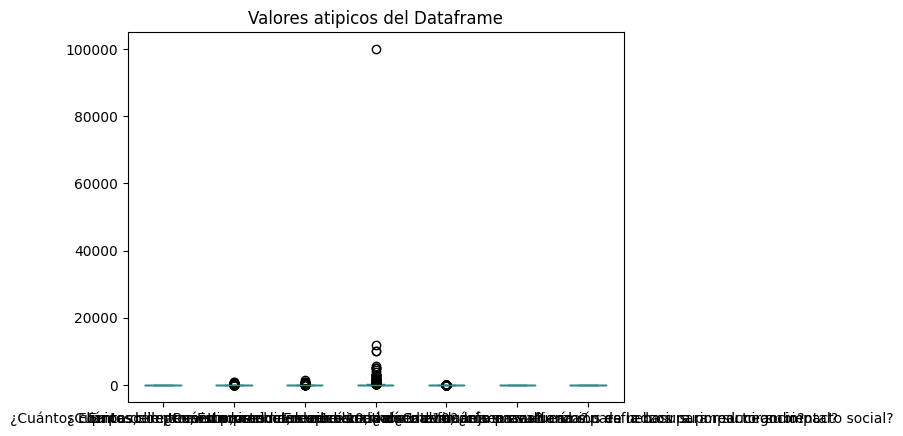

In [36]:

#Realizamos diagrama de caja o bigote de cada columna del dataframe
fig=plt.figure(figsize=(15,8))
CUANTITATIVAS.plot(kind="box",vert=True)
plt.title("Valores atipicos del Dataframe")
plt.show()#DIBUJAMOS EL DIAGRAMA


In [37]:
#Metodo de desviacion estandar
Y=CUANTITATIVAS
Limite_superior=Y.mean()+3*Y.std()
Limite_inferior=Y.mean()-3*Y.std()
print("Limite superior permitido",Limite_superior)
print("Limite inferior permitido",Limite_inferior)
#Calculando rango entre los limites


Limite superior permitido Equipo del entrevistador                                                                                  7.023787
¿Cuántos clientes, en promedio, recibe en un día entre semana?                                          251.707598
¿Cuántos clientes, en promedio, recibe en un día del fin de semana?                                     350.014966
¿Cuántos productos aproximadamente maneja en su tienda?                                                9292.872060
En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?       8.499627
En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?                13.818217
En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?                   14.288616
dtype: float64
Limite inferior permitido Equipo del entrevistador                                                                                 -1.287938
¿Cuántos clie

In [38]:
#Obtenemos datos dentro de los rangos, insiders. Obtenemos datos y los outliers se convierten en nulo en el DATAFRAME
Datos_sin_outliers=CUANTITATIVAS[(Y<=Limite_superior)&(Y>=Limite_inferior)]
Datos_sin_outliers
#Convertimos los outliers en valores Nulos


,Equipo del entrevistador,"¿Cuántos clientes, en promedio, recibe en un día entre semana?","¿Cuántos clientes, en promedio, recibe en un día del fin de semana?",¿Cuántos productos aproximadamente maneja en su tienda?,En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?,"En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?","En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?"
0,4,2.0,2.0,2.0,0.0,7,8
1,3,120.0,80.0,3.0,0.0,7,9
2,3,40.0,30.0,1.0,2.0,8,8
3,3,125.0,90.0,0.0,2.0,8,9
4,3,NaN,150.0,0.0,2.0,9,9
5,3,NaN,200.0,3.0,2.0,9,8
6,3,150.0,60.0,20.0,2.0,8,8
7,3,8.0,30.0,79.0,6.0,7,7
8,3,25.0,20.0,2000.0,2.0,10,10
9,2,3.0,3.0,0.0,2.0,2,4


In [39]:
#Reemplazamos valores atipicos(nulos) del dataframe con "mean"
#Realizamos copia del DAtaframe
data_clean=Datos_sin_outliers.copy()


data_clean=data_clean.fillna(round(Datos_sin_outliers.mean(),1))
data_clean


,Equipo del entrevistador,"¿Cuántos clientes, en promedio, recibe en un día entre semana?","¿Cuántos clientes, en promedio, recibe en un día del fin de semana?",¿Cuántos productos aproximadamente maneja en su tienda?,En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?,"En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?","En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?"
0,4,2.0,2.0,2.0,0.0,7,8
1,3,120.0,80.0,3.0,0.0,7,9
2,3,40.0,30.0,1.0,2.0,8,8
3,3,125.0,90.0,0.0,2.0,8,9
4,3,33.6,150.0,0.0,2.0,9,9
5,3,33.6,200.0,3.0,2.0,9,8
6,3,150.0,60.0,20.0,2.0,8,8
7,3,8.0,30.0,79.0,6.0,7,7
8,3,25.0,20.0,2000.0,2.0,10,10
9,2,3.0,3.0,0.0,2.0,2,4


In [40]:
#Identificar valores nulos por columna
valores_nulos=data_clean.isnull().sum()
valores_nulos


Equipo del entrevistador                                                                               0
¿Cuántos clientes, en promedio, recibe en un día entre semana?                                         0
¿Cuántos clientes, en promedio, recibe en un día del fin de semana?                                    0
¿Cuántos productos aproximadamente maneja en su tienda?                                                0
En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?    0
En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?              0
En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?                 0
dtype: int64

In [41]:
#filtro PARA obtener variables cuantitativas
CUALITATIVAS=df.iloc[:,[0,1,2,3,5,6,7,8,9,10,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,20]]#VARIABLES cualitativas, columnnas
CUALITATIVAS


,Marca temporal,Nombre del estudiante entrevistador,Matrícula del estudiante entrevistador,Grupo al cual pertenece,Nombre del negocio a entrevistar,Dirección del negocio a entrevistar,Colonia/zona del negocio a entrevistar,Tipo de negocio,Rol de la persona entrevistada,Antiguedad del negocio,En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana),¿Qué forma de pago permite a sus clientes?,"¿Ha participado en algún plan de colaboración con otras tiendas o empresas? \n(por ejemplo, esfuerzos conjuntos de marketing, compras al por mayor, servicios de entrega compartidos)",En caso de una respuesta afirmativa a la pregunta anterior ¿Qué le motivó a explorar oportunidades de colaboración en su negocio de tiendas? \n(Seleccione todas las que procedan),¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan),En los últimos seis meses ¿ha implementado alguna tecnología digital en su negocio?,"En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados",¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan),¿A través de cuáles de los siguientes medios se comunicas con los proveedores?,¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?,¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan),¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?,¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido",¿Considera necesario el apoyo gubernamental para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido.1","En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados"
0,2/11/2023 19:14:21,Eduardo Yael Tomas Chapital,A01736657,G303 (LMiJ con Diana y Andrés),Prueba1,Prueba 2,Prueba colonia,Prueba,Dueño del negocio,Entre 0 y 6 meses,2 veces al mes,Efectivo,Sí,Obtener más clientes,Dificultad para encontrar socios adecuados,No,No aplica,Aumentar las ventas,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Muy satisfecho,No,no ha recibido,No,No aplica,No aplica
1,3/11/2023 13:04:08,Josue Nicolás Perez Villegas,A01737346,G301 (LMiJ con Gabriela y Alfredo),Helados siente la alegría,Calle 5 de mayo y calle reforma,Centro histórico de puebla,Heladería,Empleado permanente,Entre 6 meses y un año,1 vez a la semana,Efectivo,No,No aplica,Problemas de confianza y fiabilidad,No,No aplica,Ninguna,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Algo satisfecho,No,no ha recibido,Sí,Ninguno,No aplica
2,3/11/2023 13:09:02,Alan De La Fuente Pérez,A01737659,G301 (LMiJ con Gabriela y Alfredo),Librería Leon,Entre 3 y 5 sur,Centro histórico,Librería,Empleado temporal,Entre 1 y 3 años,1 cada 4 meses,"Efectivo, Tarjeta de debito, Tarjeta de crédito",Sí,"Obtener más clientes, Mejorar mi operación","Complejidades jurídicas o contractuales, Probl...",Sí,"Redes sociales (Instagram, X, entre otras), Pl...","Mejorar la eficiencia, Aumentar las ventas, Me...","Llamadas telefónicas, Mensajería instantánea (...","Visitas personales, Páginas web",Altos costos de ciertas tecnologías,Algo satisfecho,No,no ha recibido,No,No aplica,"Redes sociales (Instagram, X, entre otras), Pl..."
3,3/11/2023 13:09:03,Josue Nicolás Perez Villegas,A01737346,G301 (LMiJ con Gabriela y Alfredo),Dulcería sindy,Calle 5 de mayo y 6 poniente,Centro histórico de puebla,Dulceria,Empleado temporal,Entre 0 y 6 meses,2 veces al mes,"Efectivo, Tarjeta de debito, Tarjeta de crédito",N

In [42]:
Dataframe_final = pd.concat([CUALITATIVAS, data_clean], axis=1)
Dataframe_final


,Marca temporal,Nombre del estudiante entrevistador,Matrícula del estudiante entrevistador,Grupo al cual pertenece,Nombre del negocio a entrevistar,Dirección del negocio a entrevistar,Colonia/zona del negocio a entrevistar,Tipo de negocio,Rol de la persona entrevistada,Antiguedad del negocio,En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana),¿Qué forma de pago permite a sus clientes?,"¿Ha participado en algún plan de colaboración con otras tiendas o empresas? \n(por ejemplo, esfuerzos conjuntos de marketing, compras al por mayor, servicios de entrega compartidos)",En caso de una respuesta afirmativa a la pregunta anterior ¿Qué le motivó a explorar oportunidades de colaboración en su negocio de tiendas? \n(Seleccione todas las que procedan),¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan),En los últimos seis meses ¿ha implementado alguna tecnología digital en su negocio?,"En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados",¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan),¿A través de cuáles de los siguientes medios se comunicas con los proveedores?,¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?,¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan),¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?,¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido",¿Considera necesario el apoyo gubernamental para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido.1","En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados",Equipo del entrevistador,"¿Cuántos clientes, en promedio, recibe en un día entre semana?","¿Cuántos clientes, en promedio, recibe en un día del fin de semana?",¿Cuántos productos aproximadamente maneja en su tienda?,En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?,"En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?","En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?"
0,2/11/2023 19:14:21,Eduardo Yael Tomas Chapital,A01736657,G303 (LMiJ con Diana y Andrés),Prueba1,Prueba 2,Prueba colonia,Prueba,Dueño del negocio,Entre 0 y 6 meses,2 veces al mes,Efectivo,Sí,Obtener más clientes,Dificultad para encontrar socios adecuados,No,No aplica,Aumentar las ventas,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Muy satisfecho,No,no ha recibido,No,No aplica,No aplica,4,2.0,2.0,2.0,0.0,7,8
1,3/11/2023 13:04:08,Josue Nicolás Perez Villegas,A01737346,G301 (LMiJ con Gabriela y Alfredo),Helados siente la alegría,Calle 5 de mayo y calle reforma,Centro histórico de puebla,Heladería,Empleado permanente,Entre 6 meses y un año,1 vez a la semana,Efectivo,No,No aplica,Problemas de confianza y fiabilidad,No,No aplica,Ninguna,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Algo satisfecho,No,no ha recibido,Sí,Ninguno,No aplica,3,120.0,80.0,3.0,0.0,7,9
2,3/11/2023 13:09:02,Alan De La Fuente Pérez,A01737659,G301 (LMiJ con Gabriela y Alfredo),Librería Leon,Entre 3 y 5 sur,Centro histórico,Librería,Empleado temporal,Entre 1 y 3 años,1 cada 4 meses,"Efectivo, Tarjeta de debito, Tarjeta de crédito",Sí,"Obtener más clientes, Mejorar mi operación","Complejidades jurídicas o contractuales, Probl...",Sí,"Redes sociales (Instagram, X, entre otras), Pl...","Mejor

In [43]:
#Convertir DataFrame a CSV
Dataframe_final.to_csv("DataframeEquipo3Procesado.csv")

In [44]:
#descargar archivo filtrado en csv
from google.colab import files

In [ ]:
files.download("DataframeEquipo3Procesado.csv")

In [45]:
#Carga desde un archivo .xlsx sin indice
Micro_Retailer= pd.read_csv('DataframeEquipo3Procesado.csv')

In [ ]:
#Verificamos información del DataFrame
Micro_Retailer.info()

In [47]:
#Imprimo los primeros 5 registro del dataframe
Micro_Retailer.head(5)

,Unnamed: 0,Marca temporal,Nombre del estudiante entrevistador,Matrícula del estudiante entrevistador,Grupo al cual pertenece,Nombre del negocio a entrevistar,Dirección del negocio a entrevistar,Colonia/zona del negocio a entrevistar,Tipo de negocio,Rol de la persona entrevistada,Antiguedad del negocio,En promedio ¿cada cuanto realiza pedidos a sus proveedores o compra sus productos? (Use la cifra más cercana),¿Qué forma de pago permite a sus clientes?,"¿Ha participado en algún plan de colaboración con otras tiendas o empresas? \n(por ejemplo, esfuerzos conjuntos de marketing, compras al por mayor, servicios de entrega compartidos)",En caso de una respuesta afirmativa a la pregunta anterior ¿Qué le motivó a explorar oportunidades de colaboración en su negocio de tiendas? \n(Seleccione todas las que procedan),¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan),En los últimos seis meses ¿ha implementado alguna tecnología digital en su negocio?,"En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados",¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan),¿A través de cuáles de los siguientes medios se comunicas con los proveedores?,¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?,¿Qué retos o barreras ha encontrado a la hora de adoptar la tecnología en su negocio? \n(Seleccione todas las que procedan),¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?,¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido",¿Considera necesario el apoyo gubernamental para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?,"En caso de una respuesta afirmativa, comente cuál es/fue el apoyo recibido.1","En caso de una respuesta afirmativa a la pregunta anterior, especifique los tipos de tecnología implementados.1",Equipo del entrevistador,"¿Cuántos clientes, en promedio, recibe en un día entre semana?","¿Cuántos clientes, en promedio, recibe en un día del fin de semana?",¿Cuántos productos aproximadamente maneja en su tienda?,En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?,"En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?","En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?"
0,0,2/11/2023 19:14:21,Eduardo Yael Tomas Chapital,A01736657,G303 (LMiJ con Diana y Andrés),Prueba1,Prueba 2,Prueba colonia,Prueba,Dueño del negocio,Entre 0 y 6 meses,2 veces al mes,Efectivo,Sí,Obtener más clientes,Dificultad para encontrar socios adecuados,No,No aplica,Aumentar las ventas,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Muy satisfecho,No,no ha recibido,No,No aplica,No aplica,4,2.0,2.0,2.0,0.0,7,8
1,1,3/11/2023 13:04:08,Josue Nicolás Perez Villegas,A01737346,G301 (LMiJ con Gabriela y Alfredo),Helados siente la alegría,Calle 5 de mayo y calle reforma,Centro histórico de puebla,Heladería,Empleado permanente,Entre 6 meses y un año,1 vez a la semana,Efectivo,No,No aplica,Problemas de confianza y fiabilidad,No,No aplica,Ninguna,Llamadas telefónicas,Visitas personales,Falta de capacitación sobre su uso,Algo satisfecho,No,no ha recibido,Sí,Ninguno,No aplica,3,120.0,80.0,3.0,0.0,7,9
2,2,3/11/2023 13:09:02,Alan De La Fuente Pérez,A01737659,G301 (LMiJ con Gabriela y Alfredo),Librería Leon,Entre 3 y 5 sur,Centro histórico,Librería,Empleado temporal,Entre 1 y 3 años,1 cada 4 meses,"Efectivo, Tarjeta de debito, Tarjeta de crédito",Sí,"Obtener más clientes, Mejorar mi operación","Complejidades jurídicas o contractuales, Probl...",Sí,"Redes sociales (Instagram, X, entre ot

In [48]:
df.iloc[:,[28]]

,¿Considera necesario el apoyo gubernamental para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz?
0,No
1,Sí
2,No
3,No
4,No
5,No
6,No
7,No
8,No
9,No


In [51]:
#Obtengo un análisis univariado de las variables categóricas

freq_tbl(df)

Se han truncado las últimas 5000 líneas del flujo de salida.
52                                         Miscelánea           2    0.001715   
53                                         Tlapalería           2    0.001715   
54                                           Abarrotes          2    0.001715   
55                                           Mueblería          2    0.001715   
56                                      Salón de uñas           2    0.001715   
57                                          Lavanderia          2    0.001715   
58                               Productos de limpieza          2    0.001715   
59                                          Mueblería           2    0.001715   
60                                         Artesanías           2    0.001715   
61                                                Ropa          2    0.001715   
62                                            Floreria          2    0.001715   
63                                         Ferre

<Axes: ylabel='frequency'>

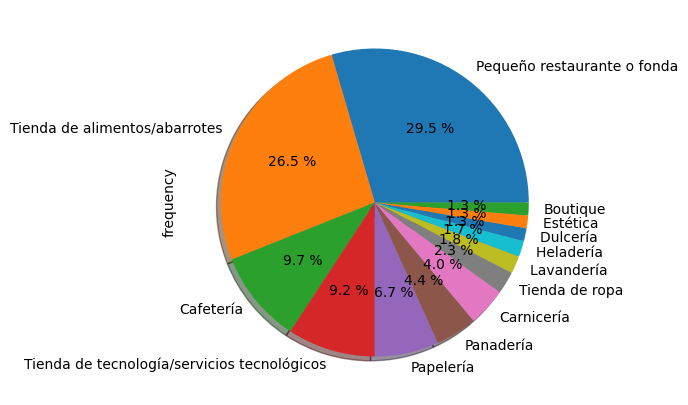

In [52]:
#codigo 1
#Obtengo un análisis univariado de una variable categórica en específico
table1= freq_tbl(df['Tipo de negocio'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro1= table1[table1['frequency']>7]
#Ajusto el indice de mi dataframe
Filtro1_index= Filtro1.set_index('Tipo de negocio')
#Realizamos grafico de pastel del dataframe filtrado
Filtro1_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

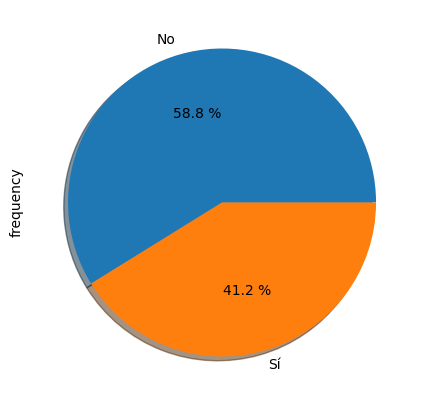

In [112]:
#codigo 2
#Obtengo un análisis univariado de una variable categórica en específico
table2= freq_tbl(df['¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? '])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro2= table2[table2['frequency']>2]
#Ajusto el indice de mi dataframe
Filtro2_index= Filtro2.set_index('¿Consideran necesarias las iniciativas de los proveedores para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? ')
#Realizamos grafico de pastel del dataframe filtrado
Filtro2_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

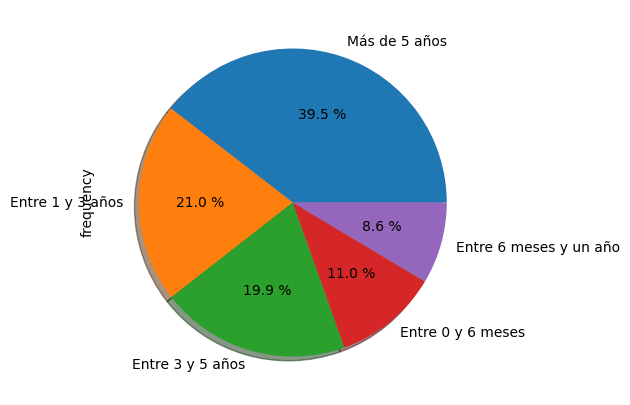

In [54]:
#codigo 3
#Obtengo un análisis univariado de una variable categórica en específico
table3= freq_tbl(df['Antiguedad del negocio'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro3= table3[table3['frequency']>7]
#Ajusto el indice de mi dataframe
Filtro3_index= Filtro3.set_index('Antiguedad del negocio')
#Realizamos grafico de pastel del dataframe filtrado
Filtro3_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

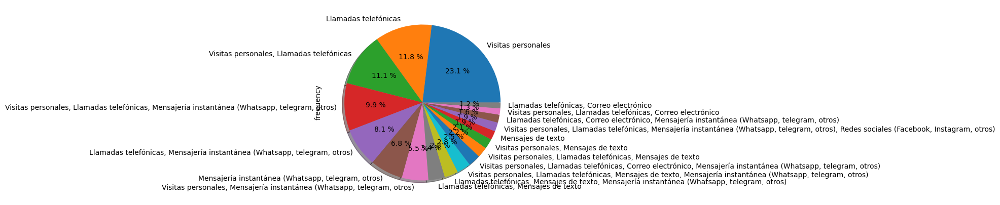

In [62]:
#codigo 4
#Obtengo un análisis univariado de una variable categórica en específico
table4= freq_tbl(Micro_Retailer['¿A través de cuáles de los siguientes medios se comunicas con los proveedores?'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro4= table4[table4['frequency']>10]
#Ajusto el indice de mi dataframe
Filtro4_index= Filtro4.set_index('¿A través de cuáles de los siguientes medios se comunicas con los proveedores?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro4_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

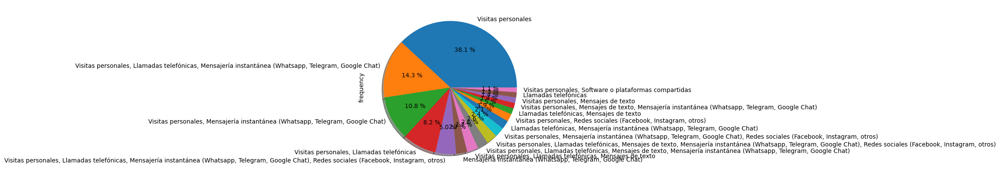

In [71]:
#codigo 5
#Obtengo un análisis univariado de una variable categórica en específico
table5= freq_tbl(Micro_Retailer['¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro5= table5[table5['frequency']>10]
#Ajusto el indice de mi dataframe
Filtro5_index= Filtro5.set_index('¿A través de cuáles de los siguientes medios recibes pedidos de los clientes?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro5_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")


<Axes: ylabel='frequency'>

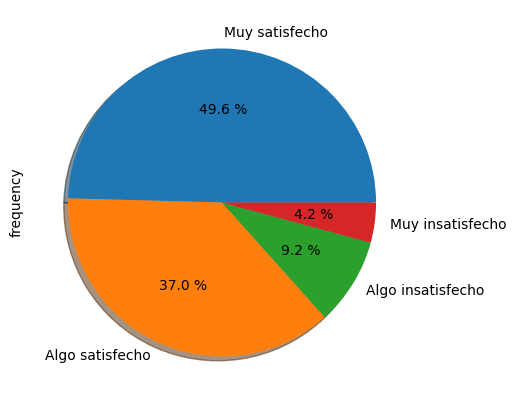

In [77]:
#codigo 6
#Obtengo un análisis univariado de una variable categórica en específico
table6= freq_tbl(Micro_Retailer['¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro6= table6[table6['frequency']>1]
#Ajusto el indice de mi dataframe
Filtro6_index= Filtro6.set_index('¿Cuál es su grado de satisfacción con las soluciones tecnológicas que ha implantado en su tienda?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro6_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

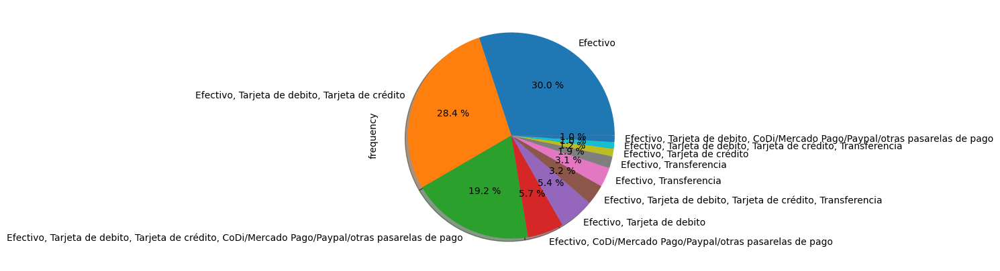

In [113]:
#codigo 7
#Obtengo un análisis univariado de una variable categórica en específico
table7= freq_tbl(Micro_Retailer['¿Qué forma de pago permite a sus clientes?'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro7= table7[table7['frequency']>10]
Filtro7
#Ajusto el indice de mi dataframe
Filtro7_index= Filtro7.set_index('¿Qué forma de pago permite a sus clientes?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro7_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

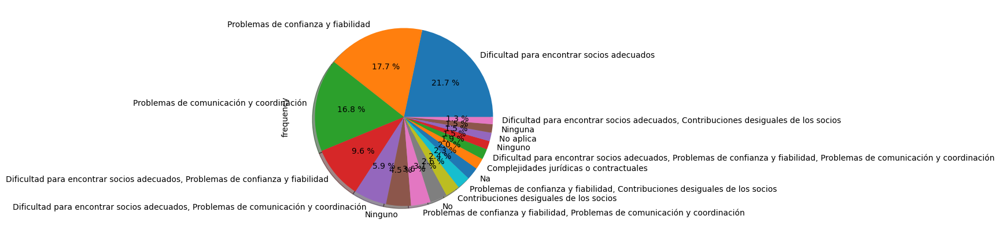

In [98]:
#Codigo8
#Obtengo un análisis univariado de una variable categórica en específico
table8= freq_tbl(Micro_Retailer['¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan)'])
table8
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro8= table8[table8['frequency']>10]
Filtro8
#Ajusto el indice de mi dataframe
Filtro8_index= Filtro8.set_index('¿Qué retos o barreras ha encontrado al intentar establecer o mantener esquemas de colaboración? (Seleccione todos los que procedan)')
#Realizamos grafico de pastel del dataframe filtrado
Filtro8_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

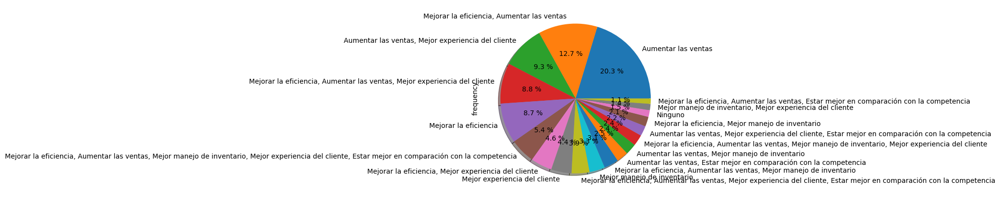

In [108]:
#Codigo 9
#Obtengo un análisis univariado de una variable categórica en específico
table9= freq_tbl(Micro_Retailer['¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan)'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro9= table9[table9['frequency']>10]
#Ajusto el indice de mi dataframe
Filtro9_index= Filtro9.set_index('¿Qué factores influyeron o influirían en su decisión de adoptar tecnología en su tienda? (Seleccione todos los que procedan)')
#Realizamos grafico de pastel del dataframe filtrado
Filtro9_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

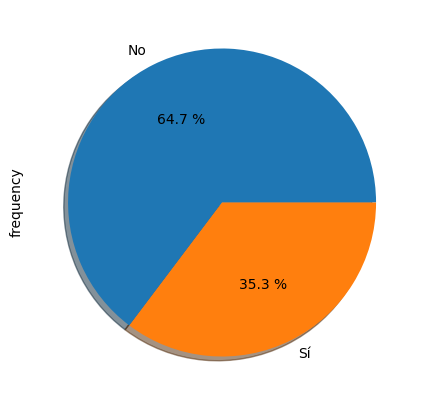

In [110]:
#Codigo10
#Obtengo un análisis univariado de una variable categórica en específico
table10= freq_tbl(Micro_Retailer['¿Considera necesario el apoyo gubernamental para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? '])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro10= table10[table10['frequency']>10]
#Ajusto el indice de mi dataframe
Filtro10_index= Filtro10.set_index('¿Considera necesario el apoyo gubernamental para ayudar a las tiendas a implantar soluciones tecnológicas de forma eficaz? ')
#Realizamos grafico de pastel del dataframe filtrado
Filtro10_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

In [114]:
#Para datos cualitativos
Micro_Retailer['Equipo del entrevistador'] = df['Equipo del entrevistador'].astype(str)
Micro_Retailer['¿Cuántos clientes, en promedio, recibe en un día entre semana?'] = df['¿Cuántos clientes, en promedio, recibe en un día entre semana?'].astype(str)
Micro_Retailer['¿Cuántos clientes, en promedio, recibe en un día del fin de semana?'] = df['¿Cuántos clientes, en promedio, recibe en un día del fin de semana?'].astype(str)
Micro_Retailer['¿Cuántos productos aproximadamente maneja en su tienda?'] = df['¿Cuántos productos aproximadamente maneja en su tienda?'].astype(str)
Micro_Retailer['En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?'] = df['En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?'].astype(str)
Micro_Retailer['En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?'] = df['En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?'].astype(str)
Micro_Retailer['En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?'] = df['En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?'].astype(str)

<Axes: ylabel='frequency'>

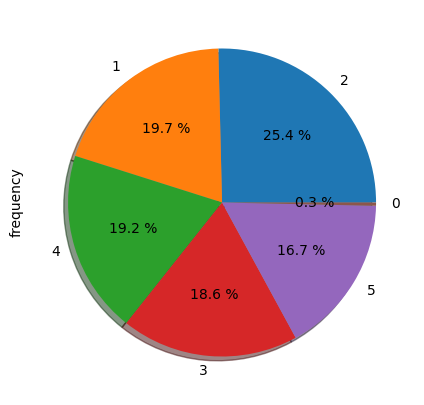

In [116]:
#Codigo11
#Obtengo un análisis univariado de una variable categórica en específico
table11= freq_tbl(Micro_Retailer.iloc[:,[28]])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro11= table11[table11['frequency']>1]
#Ajusto el indice de mi dataframe
Filtro11_index= Filtro11.set_index('Equipo del entrevistador')
#Realizamos grafico de pastel del dataframe filtrado
Filtro11_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

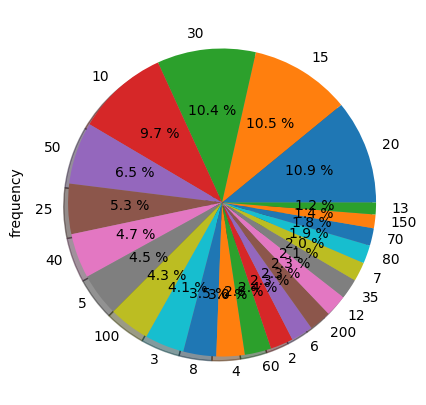

In [120]:
#Codigo12
#Obtengo un análisis univariado de una variable categórica en específico
table12= freq_tbl(Micro_Retailer.iloc[:,[29]])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro12= table12[table12['frequency']>10]
#Ajusto el indice de mi dataframe
Filtro12_index= Filtro12.set_index('¿Cuántos clientes, en promedio, recibe en un día entre semana?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro12_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

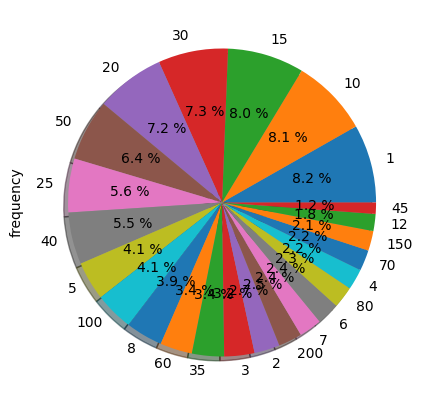

In [124]:
#Codigo13
#Obtengo un análisis univariado de una variable categórica en específico
table13= freq_tbl(Micro_Retailer.iloc[:,[30]])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro13= table13[table13['frequency']>10]
#Ajusto el indice de mi dataframe
Filtro13_index= Filtro13.set_index('¿Cuántos clientes, en promedio, recibe en un día del fin de semana?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro13_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

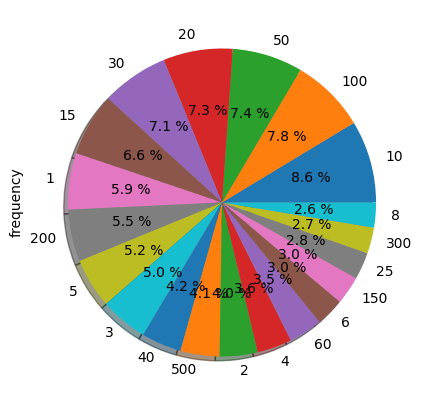

In [148]:
#Codigo14
#Obtengo un análisis univariado de una variable categórica en específico
table14= freq_tbl(Micro_Retailer['¿Cuántos productos aproximadamente maneja en su tienda?'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro14= table14[table14['frequency']>20]
Filtro14
#Ajusto el indice de mi dataframe
Filtro14_index= Filtro14.set_index('¿Cuántos productos aproximadamente maneja en su tienda?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro14_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

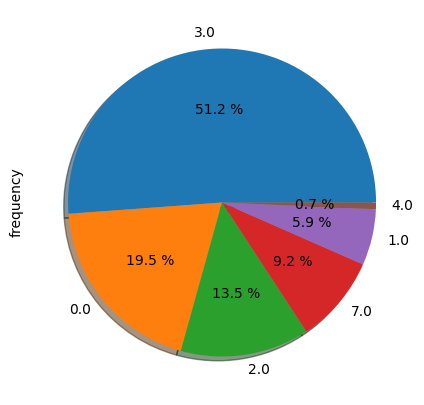

In [153]:
#Codigo15
#Obtengo un análisis univariado de una variable categórica en específico
table15= freq_tbl(Micro_Retailer['En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro15= table15[table15['frequency']>5]
#Ajusto el indice de mi dataframe
Filtro15_index= Filtro15.set_index('En caso de tener un sistema de recolección ¿Cada cuánto pasa el camión de la basura por su negocio?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro15_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

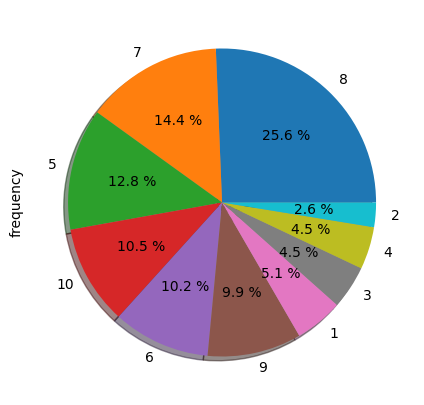

In [154]:
#Codigo16
#Obtengo un análisis univariado de una variable categórica en específico
table16= freq_tbl(Micro_Retailer['En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?'])
#Obtengo un análisis univariado de una variable categórica en específico
Filtro16= table16[table16['frequency']>1]
#Ajusto el indice de mi dataframe
Filtro16_index= Filtro16.set_index('En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto ambiental?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro16_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")

<Axes: ylabel='frequency'>

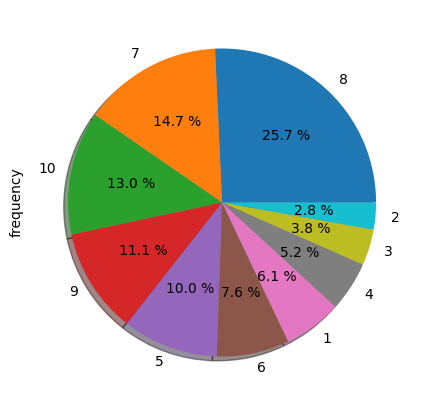

In [155]:
#Codigo17
#Obtengo un análisis univariado de una variable categórica en específico
table17= freq_tbl(Micro_Retailer['En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?'])
#Obtengo un filtro de los valores más reelevantes de la variables categórica seleccionada
Filtro17= table17[table17['frequency']>1]
#Ajusto el indice de mi dataframe
Filtro17_index= Filtro17.set_index('En una escala de 1 a 10, ¿cómo evaluaría sus esfuerzos para reducir su impacto social?')
#Realizamos grafico de pastel del dataframe filtrado
Filtro17_index["frequency"].plot(kind='pie', figsize=(10,5), shadow=True, autopct="%0.1f %%")